# Get data from drive

In [ ]:
!cp -r '/content/drive/MyDrive/cv_22641171_NgoTruongDinh/lab_bo_sung_10 03 2026/new_Data/mine_new_dataset_encrypted/new_dataset_encrypted' /content

In [ ]:
!cp -r '/content/drive/MyDrive/cv_22641171_NgoTruongDinh/lab_bo_sung_10 03 2026/new_Data/new_dataset_processed' /content

In [ ]:
import os

root = "/content/new_dataset_encrypted"
valid_exts = (".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp")

total = 0

for cls in os.listdir(root):
    cls_path = os.path.join(root, cls)
    if os.path.isdir(cls_path):
        n = sum(
            1 for f in os.listdir(cls_path)
            if f.lower().endswith(valid_exts)
        )
        print(f"{cls}: {n}")
        total += n

print("Tổng:", total)

NORMAL: 1802
PNEUMONIA: 1800
COVID: 1626
Tổng: 5228


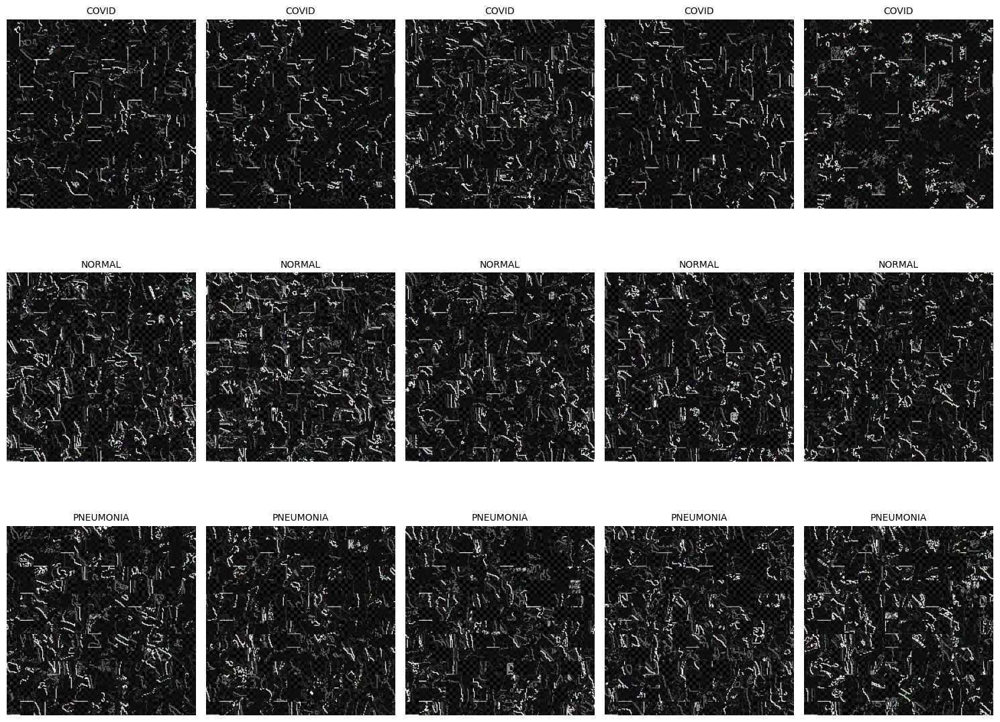

In [ ]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

root = "/content/new_dataset_encrypted"
valid_exts = (".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp")

classes = sorted([
    cls for cls in os.listdir(root)
    if os.path.isdir(os.path.join(root, cls))
])

num_rows = len(classes)
num_cols = 5

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 4 * num_rows))

if num_rows == 1:
    axes = [axes]

for i, cls in enumerate(classes):
    cls_path = os.path.join(root, cls)

    imgs = [
        os.path.join(cls_path, f)
        for f in os.listdir(cls_path)
        if f.lower().endswith(valid_exts)
    ]

    chosen = random.sample(imgs, min(num_cols, len(imgs)))

    for j in range(num_cols):
        ax = axes[i][j] if num_rows > 1 else axes[j]

        if j < len(chosen):
            img = Image.open(chosen[j]).convert("RGB")
            ax.imshow(img)
            ax.set_title(f"{cls}", fontsize=10)
        else:
            ax.imshow([[255]])
            ax.set_title(f"{cls}\n(empty)", fontsize=9)

        ax.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
import torch
from torch.utils.data import DataLoader, Subset
import numpy as np
from tqdm.auto import tqdm

def compute_mean_std(dataset, batch_size=64, num_workers=4, max_samples=2000, seed=42):

    n = len(dataset)
    if max_samples is not None and max_samples < n:
        rng = np.random.default_rng(seed)
        idx = rng.choice(n, size=max_samples, replace=False)
        dataset = Subset(dataset, idx.tolist())

    loader = DataLoader(dataset, batch_size=batch_size, shuffle=False,
                        num_workers=num_workers, pin_memory=True)

    channel_sum = torch.zeros(3)
    channel_sumsq = torch.zeros(3)
    pixel_count = 0

    for x, _ in tqdm(loader, desc="Compute mean/std"):
        # x: [B,3,H,W] in [0,1]
        b, c, h, w = x.shape
        x = x.float()

        channel_sum += x.sum(dim=[0,2,3])
        channel_sumsq += (x ** 2).sum(dim=[0,2,3])
        pixel_count += b * h * w

    mean = channel_sum / pixel_count
    var = channel_sumsq / pixel_count - mean**2
    std = torch.sqrt(var.clamp_min(1e-12))

    return mean.tolist(), std.tolist()


In [ ]:
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import Subset
from sklearn.model_selection import train_test_split
import numpy as np

ENC_ROOT = "/content/new_dataset_encrypted"

BATCH_SIZE = 128
NUM_WORKERS = 12
SEED = 42


# Load toàn bộ dataset, không cần folder train/test
full_ds = ImageFolder(ENC_ROOT)

targets = np.array(full_ds.targets)
indices = np.arange(len(full_ds))


# Split train / temp
train_idx, temp_idx = train_test_split(
    indices,
    test_size=0.3,
    stratify=targets,
    random_state=SEED
)

# Split temp thành val / test
temp_targets = targets[temp_idx]

val_idx, test_idx = train_test_split(
    temp_idx,
    test_size=0.5,
    stratify=temp_targets,
    random_state=SEED
)


print("Train:", len(train_idx))
print("Val:", len(val_idx))
print("Test:", len(test_idx))


# Transform chỉ để tính mean/std
tf_stats = transforms.Compose([
    transforms.ToTensor(),
])

stats_ds_full = ImageFolder(
    ENC_ROOT,
    transform=tf_stats
)

train_stats_ds = Subset(stats_ds_full, train_idx)


mean_enc, std_enc = compute_mean_std(
    train_stats_ds,
    batch_size=BATCH_SIZE,
    max_samples=None
)

print("mean_enc:", mean_enc)
print("std_enc :", std_enc)

Train: 3659
Val: 784
Test: 785


Compute mean/std:   0%|          | 0/29 [00:00<?, ?it/s]

mean_enc: [0.1265062838792801, 0.1264939159154892, 0.12679000198841095]
std_enc : [0.1912970095872879, 0.19120179116725922, 0.19160063564777374]


## Data loader encrypted

In [ ]:
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, Subset
import numpy as np



# =========================
# 3) Transform
# =========================

BATCH_SIZE = 16
train_tf = transforms.Compose([
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomRotation(3),
    transforms.ToTensor(),
    transforms.Normalize(mean_enc, std_enc),
])

eval_tf = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean_enc, std_enc),
])


train_enc_ds_full = ImageFolder(ENC_ROOT, transform=train_tf)
eval_enc_ds_full  = ImageFolder(ENC_ROOT, transform=eval_tf)

train_enc_ds = Subset(train_enc_ds_full, train_idx)
val_enc_ds   = Subset(eval_enc_ds_full, val_idx)
test_enc_ds  = Subset(eval_enc_ds_full, test_idx)


train_enc_loader = DataLoader(
    train_enc_ds,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    persistent_workers=(NUM_WORKERS > 0),
    drop_last=True
)

val_enc_loader = DataLoader(
    val_enc_ds,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    persistent_workers=(NUM_WORKERS > 0),
    drop_last=False
)

test_enc_loader = DataLoader(
    test_enc_ds,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    persistent_workers=(NUM_WORKERS > 0),
    drop_last=False
)


print("train:", len(train_enc_ds))
print("val  :", len(val_enc_ds))
print("test :", len(test_enc_ds))

print("classes:", train_enc_ds_full.classes)
print("class_to_idx:", train_enc_ds_full.class_to_idx)


# kiểm tra phân bố class từng split
targets = np.array(train_enc_ds_full.targets)

train_targets = targets[train_idx]
val_targets   = targets[val_idx]
test_targets  = targets[test_idx]

print("train class counts:", np.bincount(train_targets))
print("val   class counts:", np.bincount(val_targets))
print("test  class counts:", np.bincount(test_targets))

train: 3659
val  : 784
test : 785
classes: ['COVID', 'NORMAL', 'PNEUMONIA']
class_to_idx: {'COVID': 0, 'NORMAL': 1, 'PNEUMONIA': 2}
train class counts: [1138 1261 1260]
val   class counts: [244 270 270]
test  class counts: [244 271 270]


# Model

In [ ]:
import torch.optim as optim
import torch
import torch.nn as nn
from torchvision.models import resnet50, ResNet50_Weights, vgg19, VGG19_Weights

import torchvision.models as models

from tqdm.auto import tqdm
NUM_CLASSES = 3


def resnet50(num_classes=NUM_CLASSES, pretrained=True, freeze_backbone=False):
    model = models.resnet50(pretrained=pretrained)

    in_features = model.fc.in_features
    model.fc = nn.Linear(in_features, num_classes)

    if freeze_backbone:
        for name, p in model.named_parameters():
            if not name.startswith("fc."):
                p.requires_grad = False
    return model



def mobilenet_v3_small(num_classes=NUM_CLASSES,
                       pretrained=True,
                       freeze_backbone=False):

    if pretrained:
        weights = models.MobileNet_V3_Small_Weights.DEFAULT
    else:
        weights = None

    model = models.mobilenet_v3_small(weights=weights)

    in_features = model.classifier[-1].in_features
    model.classifier[-1] = nn.Linear(in_features, num_classes)

    if freeze_backbone:
        for name, p in model.named_parameters():
            if not name.startswith("classifier"):
                p.requires_grad = False

    return model



import torch.optim as optim

def make_optimizer(model, lr=1e-4, weight_decay=1e-4):
    params = [p for p in model.parameters() if p.requires_grad]
    return optim.AdamW(params, lr=lr, weight_decay=weight_decay)


# Train loop

In [ ]:
import os, csv

class EarlyStopping:
    def __init__(self, patience=8, mode="min", min_delta=1e-4):

        self.patience = patience
        self.mode = mode
        self.min_delta = min_delta
        self.best = None
        self.bad = 0

    def step(self, value):
        if self.best is None:
            self.best = value
            return False, True  # stop?, is_best?

        improved = (value < self.best - self.min_delta) if self.mode == "min" else (value > self.best + self.min_delta)

        if improved:
            self.best = value
            self.bad = 0
            return False, True
        else:
            self.bad += 1
            return (self.bad >= self.patience), False

def train_one_epoch(model, loader, optimizer, criterion, device):
    model.train()
    correct, total, loss_sum = 0, 0, 0.0

    pbar = tqdm(loader, desc="Train", leave=False)

    for x, y in pbar:
        x = x.to(device, non_blocking=True)
        y = y.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)

        out = model(x)
        loss = criterion(out, y)

        loss.backward()

        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

        optimizer.step()

        loss_sum += loss.item() * y.size(0)

        pred = out.argmax(1)
        correct += (pred == y).sum().item()
        total += y.size(0)

        pbar.set_postfix(loss=loss.item())

    return loss_sum / max(total, 1), correct / max(total, 1)


@torch.no_grad()
def evaluate(model, loader, criterion, device):
    model.eval()
    correct, total, loss_sum = 0, 0, 0.0

    for x, y in loader:
        x = x.to(device, non_blocking=True)
        y = y.to(device, non_blocking=True)

        out = model(x)
        loss = criterion(out, y)

        loss_sum += loss.item() * y.size(0)
        pred = out.argmax(1)
        correct += (pred == y).sum().item()
        total += y.size(0)

    return loss_sum / max(total, 1), correct / max(total, 1)



In [ ]:
import torch.nn as nn

import torch
import matplotlib.pyplot as plt

@torch.no_grad()
def evaluate_full(model, loader, device, num_classes=3):
    model.eval()
    all_logits = []
    all_y = []

    for x, y in loader:
        x = x.to(device, non_blocking=True)
        y = y.to(device, non_blocking=True)
        logits = model(x)

        all_logits.append(logits.detach().cpu())
        all_y.append(y.detach().cpu())

    logits = torch.cat(all_logits, dim=0)   # (N,C)
    y_true = torch.cat(all_y, dim=0)        # (N,)

    y_pred = logits.argmax(dim=1)

    # --- confusion matrix ---
    cm = torch.zeros(num_classes, num_classes, dtype=torch.long)
    for t, p in zip(y_true, y_pred):
        cm[t, p] += 1

    total = cm.sum().item()
    correct = cm.diag().sum().item()
    acc = correct / max(total, 1)

    # --- per-class precision/recall/f1/support ---
    per_class = []
    for c in range(num_classes):
        tp = cm[c, c].item()
        fp = cm[:, c].sum().item() - tp
        fn = cm[c, :].sum().item() - tp
        support = cm[c, :].sum().item()

        precision = tp / max(tp + fp, 1)
        recall    = tp / max(tp + fn, 1)
        f1        = 0.0 if (precision + recall) == 0 else (2 * precision * recall / (precision + recall))

        per_class.append({
            "precision": precision,
            "recall": recall,
            "f1": f1,
            "support": support
        })

    # --- macro averages ---
    macro_precision = sum(d["precision"] for d in per_class) / num_classes
    macro_recall    = sum(d["recall"] for d in per_class) / num_classes
    macro_f1        = sum(d["f1"] for d in per_class) / num_classes

    # --- weighted averages ---
    supports = [d["support"] for d in per_class]
    total_support = max(sum(supports), 1)

    weighted_precision = sum(d["precision"] * d["support"] for d in per_class) / total_support
    weighted_recall    = sum(d["recall"]    * d["support"] for d in per_class) / total_support
    weighted_f1        = sum(d["f1"]        * d["support"] for d in per_class) / total_support

    # --- micro (multi-class single-label: micro P=R=F1=accuracy) ---
    micro_precision = acc
    micro_recall = acc
    micro_f1 = acc

    # --- return dict ---
    return {
        "acc": acc,
        "micro_precision": micro_precision,
        "micro_recall": micro_recall,
        "micro_f1": micro_f1,

        "macro_precision": macro_precision,
        "macro_recall": macro_recall,
        "macro_f1": macro_f1,

        "weighted_precision": weighted_precision,
        "weighted_recall": weighted_recall,
        "weighted_f1": weighted_f1,

        "per_class": per_class,
        "confusion_matrix": cm,
        "logits": logits,
        "y_true": y_true
    }


def plot_confusion_matrix(cm, class_names=None, normalize=False, figsize=(6, 5)):
    cm = cm.clone().float()

    if normalize:
        row_sums = cm.sum(dim=1, keepdim=True).clamp_min(1)
        cm = cm / row_sums

    num_classes = cm.shape[0]

    if class_names is None:
        class_names = [str(i) for i in range(num_classes)]

    plt.figure(figsize=figsize)
    plt.imshow(cm, interpolation='nearest', cmap='Blues')
    plt.title('Confusion Matrix')
    plt.colorbar()

    tick_marks = range(num_classes)
    plt.xticks(tick_marks, class_names, rotation=45)
    plt.yticks(tick_marks, class_names)

    thresh = cm.max().item() / 2 if cm.numel() > 0 else 0.5

    for i in range(num_classes):
        for j in range(num_classes):
            value = cm[i, j].item()
            text = f"{value:.2f}" if normalize else f"{int(value)}"
            plt.text(
                j, i, text,
                ha="center", va="center",
                color="white" if value > thresh else "black"
            )

    plt.ylabel("True label")
    plt.xlabel("Predicted label")
    plt.tight_layout()
    plt.show()



In [ ]:
def fit(model, train_loader, val_loader, mixup, device="cuda", epochs=30, lr=3e-4, weight_decay=1e-4,
        use_amp=True, patience=8, csv_path="logs/train_log.csv", best_path="checkpoints/best.pt",
        num_classes=3):

    device = torch.device(device if torch.cuda.is_available() else "cpu")
    model.to(device)

    # Label smoothing
    criterion = nn.CrossEntropyLoss(label_smoothing=0.05)

    optimizer = torch.optim.AdamW(
        [p for p in model.parameters() if p.requires_grad],
        lr=lr,
        weight_decay=weight_decay
    )

    # Cosine scheduler (better than plateau)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer, T_max=epochs
    )

    scaler = torch.amp.GradScaler('cuda') if (use_amp and device.type == "cuda") else None
    es = EarlyStopping(patience=patience, mode="max")

    os.makedirs(os.path.dirname(csv_path) or ".", exist_ok=True)
    os.makedirs(os.path.dirname(best_path) or ".", exist_ok=True)

    with open(csv_path, "w", newline="") as f:
        w = csv.writer(f)
        w.writerow(["epoch", "lr", "train_loss", "train_acc", "val_loss", "val_acc", "val_macro_f1", "is_best"])

    for ep in range(1, epochs + 1):

        train_loss, train_acc = train_one_epoch(
            model, train_loader, optimizer, criterion, device,
            scaler=scaler, use_mixup=mixup   # bật mixup
        )

        val_loss, val_acc = evaluate(model, val_loader, criterion, device)
        val_full = evaluate_full(model, val_loader, device, num_classes=num_classes)
        val_macro_f1 = val_full["macro_f1"]

        scheduler.step()
        curr_lr = optimizer.param_groups[0]["lr"]

        should_stop, is_best = es.step(val_macro_f1)

        if is_best:
            torch.save({
                "epoch": ep,
                "model_state": model.state_dict(),
                "best_value": es.best,
            }, best_path)

        with open(csv_path, "a", newline="") as f:
            w = csv.writer(f)
            w.writerow([ep, curr_lr, train_loss, train_acc, val_loss, val_acc, val_macro_f1, int(is_best)])

        print(
            f"Epoch {ep:02d}/{epochs} | "
            f"train loss {train_loss:.4f} acc {train_acc:.4f} || "
            f"val loss {val_loss:.4f} acc {val_acc:.4f} macroF1 {val_macro_f1:.4f} | lr {curr_lr:.2e}"
            + (" save" if is_best else "")
        )

        if should_stop:
            print(f"Early stopping at epoch {ep} (best macroF1={es.best:.4f})")
            break

    return best_path, csv_path

# Train no-privacy

In [ ]:
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import Subset
from sklearn.model_selection import train_test_split
import numpy as np

ORG_ROOT = "/content/new_dataset_processed"

BATCH_SIZE = 64
NUM_WORKERS = 12
SEED = 42


full_org_ds = ImageFolder(ORG_ROOT)

targets_org = np.array(full_org_ds.targets)
indices_org = np.arange(len(full_org_ds))


train_idx_org, temp_idx_org = train_test_split(
    indices_org,
    test_size=0.3,
    stratify=targets_org,
    random_state=SEED
)

temp_targets_org = targets_org[temp_idx_org]

val_idx_org, test_idx_org = train_test_split(
    temp_idx_org,
    test_size=0.5,
    stratify=temp_targets_org,
    random_state=SEED
)


print("Train:", len(train_idx_org))
print("Val:", len(val_idx_org))
print("Test:", len(test_idx_org))


tf_stats = transforms.Compose([
    transforms.ToTensor(),
])

stats_org_ds_full = ImageFolder(
    ORG_ROOT,
    transform=tf_stats
)

train_org_stats_ds = Subset(
    stats_org_ds_full,
    train_idx_org
)


mean_origin, std_origin = compute_mean_std(
    train_org_stats_ds,
    batch_size=BATCH_SIZE,
    max_samples=None
)

print("mean_origin:", mean_origin)
print("std_origin :", std_origin)

Train: 3659
Val: 784
Test: 785


Compute mean/std:   0%|          | 0/58 [00:00<?, ?it/s]

mean_origin: [0.5019229650497437, 0.502015233039856, 0.5021896362304688]
std_origin : [0.23932693898677826, 0.2393261194229126, 0.23936845362186432]


In [ ]:
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, Subset
import numpy as np

# ORG_ROOT = "/content/data_processed"
# train_idx_org, val_idx_org, test_idx_org đã có
# mean_origin, std_origin đã có


# =========================
# 3) Transform
# =========================
train_tf_origin = transforms.Compose([
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomRotation(3),
    transforms.ToTensor(),
    transforms.Normalize(mean_origin, std_origin),
])

eval_tf_origin = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean_origin, std_origin),
])


train_origin_ds_full = ImageFolder(ORG_ROOT, transform=train_tf_origin)
eval_origin_ds_full  = ImageFolder(ORG_ROOT, transform=eval_tf_origin)

train_origin_ds = Subset(train_origin_ds_full, train_idx_org)
val_origin_ds   = Subset(eval_origin_ds_full, val_idx_org)
test_origin_ds  = Subset(eval_origin_ds_full, test_idx_org)


train_origin_loader = DataLoader(
    train_origin_ds,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    persistent_workers=(NUM_WORKERS > 0),
    drop_last=True
)

val_origin_loader = DataLoader(
    val_origin_ds,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    persistent_workers=(NUM_WORKERS > 0),
    drop_last=False
)

test_origin_loader = DataLoader(
    test_origin_ds,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    persistent_workers=(NUM_WORKERS > 0),
    drop_last=False
)


print("train:", len(train_origin_ds))
print("val  :", len(val_origin_ds))
print("test :", len(test_origin_ds))

print("classes:", train_origin_ds_full.classes)
print("class_to_idx:", train_origin_ds_full.class_to_idx)


# kiểm tra phân bố class từng split
train_targets_org = targets_org[train_idx_org]
val_targets_org   = targets_org[val_idx_org]
test_targets_org  = targets_org[test_idx_org]

print("train class counts:", np.bincount(train_targets_org))
print("val   class counts:", np.bincount(val_targets_org))
print("test  class counts:", np.bincount(test_targets_org))

train: 3659
val  : 784
test : 785
classes: ['COVID', 'NORMAL', 'PNEUMONIA']
class_to_idx: {'COVID': 0, 'NORMAL': 1, 'PNEUMONIA': 2}
train class counts: [1138 1261 1260]
val   class counts: [244 270 270]
test  class counts: [244 271 270]


## no-privacy Resnet

In [ ]:
import math
device = "cuda" if torch.cuda.is_available() else "cpu"

EPOCHS = 50
LR = 3e-4

model_resnet_origin = mobilenet_v3_small(
    num_classes=3,
    pretrained=True,
    freeze_backbone=False
).to(device)

best_path, csv_path = fit(
    model_resnet_origin,
    train_loader=train_origin_loader,
    val_loader=val_origin_loader,
    device=device,
    epochs=EPOCHS,
    mixup = False,
    lr=LR,
    weight_decay=1e-4,
    patience=5,
    csv_path="logs/mobilenet_v3_small_origin_log.csv",
    best_path="checkpoints/mobilenet_v3_small_origin_best.pt",
    num_classes=3,
    use_amp=True,
)

Downloading: "https://download.pytorch.org/models/mobilenet_v3_small-047dcff4.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_small-047dcff4.pth


100%|██████████| 9.83M/9.83M [00:00<00:00, 196MB/s]


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 01/50 | train loss 0.3678 acc 0.9243 || val loss 0.5600 acc 0.7628 macroF1 0.7476 | lr 3.00e-04 save


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 02/50 | train loss 0.2292 acc 0.9775 || val loss 0.6276 acc 0.7398 macroF1 0.7127 | lr 2.99e-04


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 03/50 | train loss 0.2098 acc 0.9838 || val loss 0.5413 acc 0.7934 macroF1 0.7829 | lr 2.97e-04 save


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 04/50 | train loss 0.2046 acc 0.9885 || val loss 0.4947 acc 0.8125 macroF1 0.8042 | lr 2.95e-04 save


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 05/50 | train loss 0.1930 acc 0.9931 || val loss 0.3874 acc 0.9005 macroF1 0.9008 | lr 2.93e-04 save


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 06/50 | train loss 0.1914 acc 0.9929 || val loss 0.3123 acc 0.9286 macroF1 0.9293 | lr 2.89e-04 save


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 07/50 | train loss 0.1834 acc 0.9959 || val loss 0.3076 acc 0.9375 macroF1 0.9391 | lr 2.86e-04 save


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 08/50 | train loss 0.1899 acc 0.9921 || val loss 0.2411 acc 0.9630 macroF1 0.9641 | lr 2.81e-04 save


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 09/50 | train loss 0.1810 acc 0.9975 || val loss 0.2056 acc 0.9872 macroF1 0.9876 | lr 2.77e-04 save


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 10/50 | train loss 0.1848 acc 0.9953 || val loss 0.2153 acc 0.9847 macroF1 0.9851 | lr 2.71e-04


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 11/50 | train loss 0.1815 acc 0.9959 || val loss 0.2036 acc 0.9847 macroF1 0.9848 | lr 2.66e-04


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 12/50 | train loss 0.1796 acc 0.9973 || val loss 0.2002 acc 0.9885 macroF1 0.9888 | lr 2.59e-04 save


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 13/50 | train loss 0.1794 acc 0.9973 || val loss 0.2117 acc 0.9860 macroF1 0.9864 | lr 2.53e-04


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 14/50 | train loss 0.1772 acc 0.9975 || val loss 0.1942 acc 0.9936 macroF1 0.9938 | lr 2.46e-04 save


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 15/50 | train loss 0.1748 acc 0.9992 || val loss 0.1937 acc 0.9911 macroF1 0.9913 | lr 2.38e-04


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 16/50 | train loss 0.1727 acc 0.9995 || val loss 0.1917 acc 0.9923 macroF1 0.9925 | lr 2.30e-04


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 17/50 | train loss 0.1728 acc 0.9995 || val loss 0.1993 acc 0.9872 macroF1 0.9876 | lr 2.22e-04


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 18/50 | train loss 0.1731 acc 0.9989 || val loss 0.1945 acc 0.9898 macroF1 0.9901 | lr 2.14e-04


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 19/50 | train loss 0.1723 acc 0.9997 || val loss 0.1940 acc 0.9885 macroF1 0.9888 | lr 2.05e-04
Early stopping at epoch 19 (best macroF1=0.9938)


## no-privacy Mobilenet-v3-small

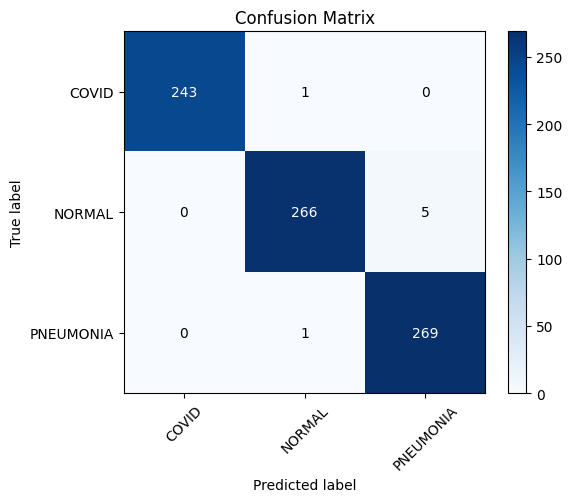

TEST acc         : 0.9910828025477707
TEST macro_f1    : 0.9913100623859773
TEST weighted_f1 : 0.9910847791210239
TEST per_class   : [{'precision': 1.0, 'recall': 0.9959016393442623, 'f1': 0.997946611909651, 'support': 244}, {'precision': 0.9925373134328358, 'recall': 0.981549815498155, 'f1': 0.9870129870129871, 'support': 271}, {'precision': 0.9817518248175182, 'recall': 0.9962962962962963, 'f1': 0.9889705882352942, 'support': 270}]


{'acc': 0.9910828025477707,
 'micro_precision': 0.9910828025477707,
 'micro_recall': 0.9910828025477707,
 'micro_f1': 0.9910828025477707,
 'macro_precision': 0.991429712750118,
 'macro_recall': 0.9912492503795712,
 'macro_f1': 0.9913100623859773,
 'weighted_precision': 0.991147267058635,
 'weighted_recall': 0.9910828025477707,
 'weighted_f1': 0.9910847791210239,
 'per_class': [{'precision': 1.0,
   'recall': 0.9959016393442623,
   'f1': 0.997946611909651,
   'support': 244},
  {'precision': 0.9925373134328358,
   'recall': 0.981549815498155,
   'f1': 0.9870129870129871,
   'support': 271},
  {'precision': 0.9817518248175182,
   'recall': 0.9962962962962963,
   'f1': 0.9889705882352942,
   'support': 270}],
 'confusion_matrix': tensor([[243,   1,   0],
         [  0, 266,   5],
         [  0,   1, 269]]),
 'logits': tensor([[-1.6119, -1.2981,  2.8285],
         [-1.3158,  3.0047, -1.6473],
         [-1.3164,  2.7643, -1.6558],
         ...,
         [ 2.5706, -1.2303, -0.9344],
        

In [ ]:
# load best model
ckpt = torch.load("checkpoints/mobilenet_v3_small_origin_best.pt", map_location=device)

if isinstance(ckpt, dict) and "model_state" in ckpt:
    model_resnet_origin.load_state_dict(ckpt["model_state"])
else:
    model_resnet_origin.load_state_dict(ckpt)

model_resnet_origin.to(device)
model_resnet_origin.eval()

# evaluate on TEST
test_result = evaluate_full(
    model_resnet_origin,
    test_origin_loader,
    device=device,
    num_classes=3
)

plot_confusion_matrix(
    test_result["confusion_matrix"],
    class_names=train_origin_ds_full.classes,
    normalize=False
)

print("TEST acc         :", test_result["acc"])
print("TEST macro_f1    :", test_result["macro_f1"])
print("TEST weighted_f1 :", test_result["weighted_f1"])
print("TEST per_class   :", test_result["per_class"])

test_result

# Train privacy

## Proposed

In [ ]:
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import train_test_split
import numpy as np
import os

DATASET_ENCRYPTED_TRAIN = "/content/new_dataset_encrypted"
ENC_TRAIN = DATASET_ENCRYPTED_TRAIN

BATCH_SIZE = 64
NUM_WORKERS = 8
SEED = 42


full_ds = ImageFolder(ENC_TRAIN)
targets = np.array(full_ds.targets)
indices = np.arange(len(full_ds))

train_idx, temp_idx = train_test_split(
    indices,
    test_size=0.1,
    stratify=targets,
    random_state=SEED
)

temp_targets = targets[temp_idx]
val_idx, test_idx = train_test_split(
    temp_idx,
    test_size=0.5,
    stratify=temp_targets,
    random_state=SEED
)

tf_stats = transforms.Compose([
    transforms.ToTensor(),
])

stats_ds_full = ImageFolder(ENC_TRAIN, transform=tf_stats)
train_stats_ds = Subset(stats_ds_full, train_idx)

mean_enc, std_enc = compute_mean_std(
    train_stats_ds,
    batch_size=BATCH_SIZE,
    max_samples=None
)

print("mean_enc:", mean_enc)
print("std_enc :", std_enc)

Compute mean/std:   0%|          | 0/74 [00:00<?, ?it/s]

mean_enc: [0.12642773985862732, 0.12637783586978912, 0.12670648097991943]
std_enc : [0.19123215973377228, 0.19108504056930542, 0.1915399730205536]


In [ ]:
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import train_test_split
import numpy as np

# =========================
# 3) Transform
# =========================
ENC_TRAIN = '/content/new_dataset_encrypted'
train_tf = transforms.Compose([
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomRotation(3),
    transforms.ToTensor(),
    transforms.Normalize(mean_enc, std_enc),
])

eval_tf = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean_enc, std_enc),
])


train_enc_ds_full = ImageFolder(ENC_TRAIN, transform=train_tf)
eval_enc_ds_full  = ImageFolder(ENC_TRAIN, transform=eval_tf)

train_enc_ds = Subset(train_enc_ds_full, train_idx)
val_enc_ds   = Subset(eval_enc_ds_full, val_idx)
test_enc_ds  = Subset(eval_enc_ds_full, test_idx)


train_enc_loader = DataLoader(
    train_enc_ds,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    persistent_workers=(NUM_WORKERS > 0),
    drop_last=True
)

val_enc_loader = DataLoader(
    val_enc_ds,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    persistent_workers=(NUM_WORKERS > 0),
    drop_last=False
)

test_enc_loader = DataLoader(
    test_enc_ds,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    persistent_workers=(NUM_WORKERS > 0),
    drop_last=False
)

print("train:", len(train_enc_ds))
print("val  :", len(val_enc_ds))
print("test :", len(test_enc_ds))
print("classes:", train_enc_ds_full.classes)
print("class_to_idx:", train_enc_ds_full.class_to_idx)

# kiểm tra phân bố class từng split
train_targets = targets[train_idx]
val_targets   = targets[val_idx]
test_targets  = targets[test_idx]

print("train class counts:", np.bincount(train_targets))
print("val   class counts:", np.bincount(val_targets))
print("test  class counts:", np.bincount(test_targets))

train: 4705
val  : 261
test : 262
classes: ['COVID', 'NORMAL', 'PNEUMONIA']
class_to_idx: {'COVID': 0, 'NORMAL': 1, 'PNEUMONIA': 2}
train class counts: [1463 1622 1620]
val   class counts: [81 90 90]
test  class counts: [82 90 90]


In [ ]:
import math
device = "cuda" if torch.cuda.is_available() else "cpu"

EPOCHS = 50
LR = 1e-4

model_resnet_enc = mobilenet_v3_small(
    num_classes=3,
    pretrained=True,
    freeze_backbone=False
).to(device)

best_path, csv_path = fit(
    model_resnet_enc,
    train_loader=train_enc_loader,
    val_loader=val_enc_loader,
    mixup = False,
    device=device,
    epochs=EPOCHS,
    lr=LR,
    weight_decay=1e-4,
    patience=10,
    csv_path="logs/mobilenet_v3_small_enc_log.csv",
    best_path="checkpoints/mobilenet_v3_small_enc.pt",
    num_classes=3,
    use_amp=True,
)

Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 01/50 | train loss 0.7940 acc 0.6804 || val loss 0.7434 acc 0.6782 macroF1 0.6132 | lr 9.99e-05 save


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 02/50 | train loss 0.5229 acc 0.8320 || val loss 0.5799 acc 0.7931 macroF1 0.7838 | lr 9.96e-05 save


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 03/50 | train loss 0.4553 acc 0.8667 || val loss 0.5598 acc 0.7854 macroF1 0.7768 | lr 9.91e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 04/50 | train loss 0.4155 acc 0.8900 || val loss 0.4333 acc 0.8697 macroF1 0.8704 | lr 9.84e-05 save


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 05/50 | train loss 0.3853 acc 0.9030 || val loss 0.4160 acc 0.8851 macroF1 0.8833 | lr 9.76e-05 save


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 06/50 | train loss 0.3665 acc 0.9122 || val loss 0.3549 acc 0.9272 macroF1 0.9270 | lr 9.65e-05 save


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 07/50 | train loss 0.3495 acc 0.9234 || val loss 0.3346 acc 0.9387 macroF1 0.9387 | lr 9.52e-05 save


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 08/50 | train loss 0.3307 acc 0.9309 || val loss 0.3321 acc 0.9157 macroF1 0.9156 | lr 9.38e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 09/50 | train loss 0.3198 acc 0.9351 || val loss 0.3203 acc 0.9310 macroF1 0.9307 | lr 9.22e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 10/50 | train loss 0.3034 acc 0.9407 || val loss 0.2851 acc 0.9693 macroF1 0.9692 | lr 9.05e-05 save


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 11/50 | train loss 0.2968 acc 0.9452 || val loss 0.2710 acc 0.9579 macroF1 0.9581 | lr 8.85e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 12/50 | train loss 0.2825 acc 0.9525 || val loss 0.2754 acc 0.9579 macroF1 0.9580 | lr 8.64e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 13/50 | train loss 0.2734 acc 0.9540 || val loss 0.2720 acc 0.9655 macroF1 0.9657 | lr 8.42e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 14/50 | train loss 0.2721 acc 0.9578 || val loss 0.2521 acc 0.9770 macroF1 0.9772 | lr 8.19e-05 save


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 15/50 | train loss 0.2615 acc 0.9621 || val loss 0.2608 acc 0.9617 macroF1 0.9616 | lr 7.94e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 16/50 | train loss 0.2539 acc 0.9630 || val loss 0.2479 acc 0.9655 macroF1 0.9657 | lr 7.68e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 17/50 | train loss 0.2555 acc 0.9636 || val loss 0.2437 acc 0.9693 macroF1 0.9696 | lr 7.41e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 18/50 | train loss 0.2405 acc 0.9747 || val loss 0.2427 acc 0.9808 macroF1 0.9809 | lr 7.13e-05 save


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 19/50 | train loss 0.2415 acc 0.9692 || val loss 0.2456 acc 0.9693 macroF1 0.9696 | lr 6.84e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 20/50 | train loss 0.2342 acc 0.9735 || val loss 0.2486 acc 0.9770 macroF1 0.9772 | lr 6.55e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 21/50 | train loss 0.2327 acc 0.9765 || val loss 0.2491 acc 0.9655 macroF1 0.9661 | lr 6.24e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 22/50 | train loss 0.2356 acc 0.9737 || val loss 0.2416 acc 0.9732 macroF1 0.9738 | lr 5.94e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 23/50 | train loss 0.2303 acc 0.9767 || val loss 0.2571 acc 0.9617 macroF1 0.9623 | lr 5.63e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 24/50 | train loss 0.2275 acc 0.9773 || val loss 0.2448 acc 0.9693 macroF1 0.9698 | lr 5.31e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 25/50 | train loss 0.2170 acc 0.9831 || val loss 0.2529 acc 0.9617 macroF1 0.9621 | lr 5.00e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 26/50 | train loss 0.2193 acc 0.9824 || val loss 0.2462 acc 0.9732 macroF1 0.9735 | lr 4.69e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 27/50 | train loss 0.2137 acc 0.9854 || val loss 0.2426 acc 0.9693 macroF1 0.9695 | lr 4.37e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 28/50 | train loss 0.2135 acc 0.9829 || val loss 0.2377 acc 0.9770 macroF1 0.9775 | lr 4.06e-05
Early stopping at epoch 28 (best macroF1=0.9809)


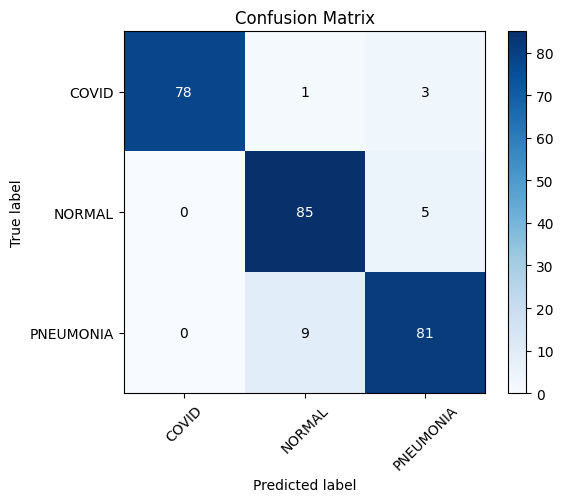

TEST acc         : 0.9312977099236641
TEST macro_f1    : 0.9329822839599377
TEST weighted_f1 : 0.9316993002640579
TEST per_class   : [{'precision': 1.0, 'recall': 0.9512195121951219, 'f1': 0.975, 'support': 82}, {'precision': 0.8947368421052632, 'recall': 0.9444444444444444, 'f1': 0.918918918918919, 'support': 90}, {'precision': 0.9101123595505618, 'recall': 0.9, 'f1': 0.9050279329608939, 'support': 90}]


{'acc': 0.9312977099236641,
 'micro_precision': 0.9312977099236641,
 'micro_recall': 0.9312977099236641,
 'micro_f1': 0.9312977099236641,
 'macro_precision': 0.9349497338852749,
 'macro_recall': 0.9318879855465222,
 'macro_f1': 0.9329822839599377,
 'weighted_precision': 0.9329634662176499,
 'weighted_recall': 0.9312977099236641,
 'weighted_f1': 0.9316993002640579,
 'per_class': [{'precision': 1.0,
   'recall': 0.9512195121951219,
   'f1': 0.975,
   'support': 82},
  {'precision': 0.8947368421052632,
   'recall': 0.9444444444444444,
   'f1': 0.918918918918919,
   'support': 90},
  {'precision': 0.9101123595505618,
   'recall': 0.9,
   'f1': 0.9050279329608939,
   'support': 90}],
 'confusion_matrix': tensor([[78,  1,  3],
         [ 0, 85,  5],
         [ 0,  9, 81]]),
 'logits': tensor([[-0.9457,  0.0550,  1.2738],
         [-1.2755,  2.9994, -1.2163],
         [ 2.3378, -1.5423, -1.4460],
         [ 3.1117, -1.6600, -1.7597],
         [-0.9010,  2.2183, -0.5124],
         [-0.5144,  2

In [ ]:
# load best model
ckpt = torch.load("checkpoints/mobilenet_v3_small_enc.pt", map_location=device)

if isinstance(ckpt, dict) and "model_state" in ckpt:
    model_resnet_enc.load_state_dict(ckpt["model_state"])
else:
    model_resnet_enc.load_state_dict(ckpt)

model_resnet_enc.to(device)
model_resnet_enc.eval()

# evaluate on TEST
test_result = evaluate_full(
    model_resnet_enc,
    test_enc_loader,
    device=device,
    num_classes=3
)

plot_confusion_matrix(
    test_result["confusion_matrix"],
    class_names=train_enc_ds_full.classes,
    normalize=False
)

print("TEST acc         :", test_result["acc"])
print("TEST macro_f1    :", test_result["macro_f1"])
print("TEST weighted_f1 :", test_result["weighted_f1"])
print("TEST per_class   :", test_result["per_class"])

test_result

## TANAKA

In [ ]:
!cp -r '/content/drive/MyDrive/cv_22641171_NgoTruongDinh/lab_bo_sung_10 03 2026/imgs_tanaka' /content/data_tanaka

In [ ]:
import os

root = "/content/data_tanaka"
valid_exts = (".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp")

total = 0

for cls in os.listdir(root):
    cls_path = os.path.join(root, cls)
    if os.path.isdir(cls_path):
        n = sum(
            1 for f in os.listdir(cls_path)
            if f.lower().endswith(valid_exts)
        )
        print(f"{cls}: {n}")
        total += n

print("Tổng:", total)

NORMAL: 1802
PNEUMONIA: 1800
COVID: 1626
Tổng: 5228


In [ ]:
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import train_test_split
import numpy as np
import os

DATASET_ENCRYPTED_TRAIN = "/content/data_tanaka"
ENC_TRAIN = DATASET_ENCRYPTED_TRAIN

BATCH_SIZE = 64
NUM_WORKERS = 8
SEED = 42


full_ds = ImageFolder(ENC_TRAIN)
targets = np.array(full_ds.targets)
indices = np.arange(len(full_ds))

train_idx, temp_idx = train_test_split(
    indices,
    test_size=0.1,
    stratify=targets,
    random_state=SEED
)

temp_targets = targets[temp_idx]
val_idx, test_idx = train_test_split(
    temp_idx,
    test_size=0.5,
    stratify=temp_targets,
    random_state=SEED
)

tf_stats = transforms.Compose([
    transforms.ToTensor(),
])

stats_ds_full = ImageFolder(ENC_TRAIN, transform=tf_stats)
train_stats_ds = Subset(stats_ds_full, train_idx)

mean_enc, std_enc = compute_mean_std(
    train_stats_ds,
    batch_size=BATCH_SIZE,
    max_samples=None
)

print("mean_enc:", mean_enc)
print("std_enc :", std_enc)

Compute mean/std:   0%|          | 0/74 [00:00<?, ?it/s]

mean_enc: [0.5015422105789185, 0.5016430020332336, 0.5018171072006226]
std_enc : [0.2395109087228775, 0.23951028287410736, 0.2395516037940979]


In [ ]:
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import train_test_split
import numpy as np

# =========================
# 3) Transform
# =========================
train_tf = transforms.Compose([
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomRotation(3),
    transforms.ToTensor(),
    transforms.Normalize(mean_enc, std_enc),
])

eval_tf = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean_enc, std_enc),
])


train_enc_ds_full = ImageFolder(ENC_TRAIN, transform=train_tf)
eval_enc_ds_full  = ImageFolder(ENC_TRAIN, transform=eval_tf)

train_enc_ds = Subset(train_enc_ds_full, train_idx)
val_enc_ds   = Subset(eval_enc_ds_full, val_idx)
test_enc_ds  = Subset(eval_enc_ds_full, test_idx)


train_enc_loader = DataLoader(
    train_enc_ds,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    persistent_workers=(NUM_WORKERS > 0),
    drop_last=True
)

val_enc_loader = DataLoader(
    val_enc_ds,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    persistent_workers=(NUM_WORKERS > 0),
    drop_last=False
)

test_enc_loader = DataLoader(
    test_enc_ds,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    persistent_workers=(NUM_WORKERS > 0),
    drop_last=False
)

print("train:", len(train_enc_ds))
print("val  :", len(val_enc_ds))
print("test :", len(test_enc_ds))
print("classes:", train_enc_ds_full.classes)
print("class_to_idx:", train_enc_ds_full.class_to_idx)

# kiểm tra phân bố class từng split
train_targets = targets[train_idx]
val_targets   = targets[val_idx]
test_targets  = targets[test_idx]

print("train class counts:", np.bincount(train_targets))
print("val   class counts:", np.bincount(val_targets))
print("test  class counts:", np.bincount(test_targets))

train: 4705
val  : 261
test : 262
classes: ['COVID', 'NORMAL', 'PNEUMONIA']
class_to_idx: {'COVID': 0, 'NORMAL': 1, 'PNEUMONIA': 2}
train class counts: [1463 1622 1620]
val   class counts: [81 90 90]
test  class counts: [82 90 90]


In [ ]:
import math
device = "cuda" if torch.cuda.is_available() else "cpu"

EPOCHS = 50
LR = 1e-4

model_resnet_enc = mobilenet_v3_small(
    num_classes=3,
    pretrained=True,
    freeze_backbone=False
).to(device)

best_path, csv_path = fit(
    model_resnet_enc,
    train_loader=train_enc_loader,
    val_loader=val_enc_loader,
    mixup = False,
    device=device,
    epochs=EPOCHS,
    lr=LR,
    weight_decay=1e-4,
    patience=10,
    csv_path="logs/mobilenet_v3_small_log_tanaka.csv",
    best_path="checkpoints/mobilenet_v3_small_tanaka.pt",
    num_classes=3,
    use_amp=True,
)

Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 01/50 | train loss 0.8129 acc 0.6423 || val loss 1.1097 acc 0.3065 macroF1 0.1569 | lr 9.99e-05 save


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 02/50 | train loss 0.5818 acc 0.8046 || val loss 1.0939 acc 0.3563 macroF1 0.2494 | lr 9.96e-05 save


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 03/50 | train loss 0.4798 acc 0.8504 || val loss 1.2022 acc 0.3985 macroF1 0.3237 | lr 9.91e-05 save


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 04/50 | train loss 0.4420 acc 0.8756 || val loss 1.1648 acc 0.4138 macroF1 0.3164 | lr 9.84e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 05/50 | train loss 0.4189 acc 0.8846 || val loss 0.8967 acc 0.6130 macroF1 0.5542 | lr 9.76e-05 save


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 06/50 | train loss 0.3960 acc 0.8975 || val loss 0.5057 acc 0.8467 macroF1 0.8452 | lr 9.65e-05 save


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 07/50 | train loss 0.3735 acc 0.9088 || val loss 0.5542 acc 0.8238 macroF1 0.8243 | lr 9.52e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 08/50 | train loss 0.3589 acc 0.9110 || val loss 0.3577 acc 0.9234 macroF1 0.9249 | lr 9.38e-05 save


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 09/50 | train loss 0.3433 acc 0.9217 || val loss 0.3487 acc 0.9234 macroF1 0.9245 | lr 9.22e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 10/50 | train loss 0.3312 acc 0.9300 || val loss 0.3180 acc 0.9387 macroF1 0.9403 | lr 9.05e-05 save


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 11/50 | train loss 0.3232 acc 0.9345 || val loss 0.3297 acc 0.9349 macroF1 0.9356 | lr 8.85e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 12/50 | train loss 0.3196 acc 0.9339 || val loss 0.3114 acc 0.9349 macroF1 0.9357 | lr 8.64e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 13/50 | train loss 0.3163 acc 0.9324 || val loss 0.2896 acc 0.9425 macroF1 0.9433 | lr 8.42e-05 save


Train:   0%|          | 0/73 [00:00<?, ?it/s]

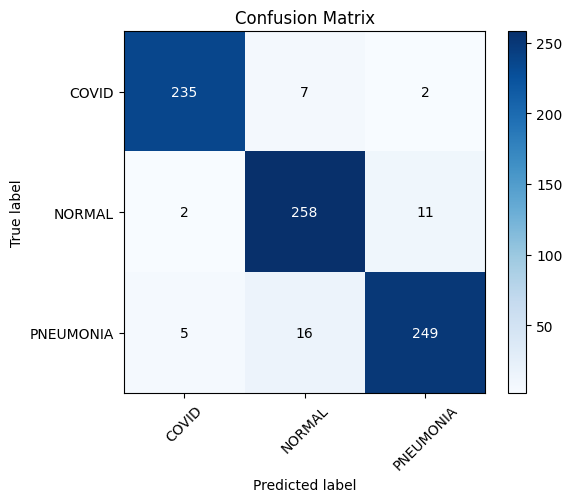

TEST acc         : 0.9452229299363057
TEST macro_f1    : 0.9459836745199913
TEST weighted_f1 : 0.9452707338192073
TEST per_class   : [{'precision': 0.9710743801652892, 'recall': 0.9631147540983607, 'f1': 0.9670781893004116, 'support': 244}, {'precision': 0.9181494661921709, 'recall': 0.9520295202952029, 'f1': 0.9347826086956523, 'support': 271}, {'precision': 0.950381679389313, 'recall': 0.9222222222222223, 'f1': 0.9360902255639098, 'support': 270}]


{'acc': 0.9452229299363057,
 'micro_precision': 0.9452229299363057,
 'micro_recall': 0.9452229299363057,
 'micro_f1': 0.9452229299363057,
 'macro_precision': 0.9465351752489243,
 'macro_recall': 0.945788832205262,
 'macro_f1': 0.9459836745199913,
 'weighted_precision': 0.9456862516350616,
 'weighted_recall': 0.9452229299363057,
 'weighted_f1': 0.9452707338192073,
 'per_class': [{'precision': 0.9710743801652892,
   'recall': 0.9631147540983607,
   'f1': 0.9670781893004116,
   'support': 244},
  {'precision': 0.9181494661921709,
   'recall': 0.9520295202952029,
   'f1': 0.9347826086956523,
   'support': 271},
  {'precision': 0.950381679389313,
   'recall': 0.9222222222222223,
   'f1': 0.9360902255639098,
   'support': 270}],
 'confusion_matrix': tensor([[235,   7,   2],
         [  2, 258,  11],
         [  5,  16, 249]]),
 'logits': tensor([[-2.0862,  0.3560,  2.6110],
         [-2.2651,  1.9809,  0.8232],
         [-1.7339,  3.5443, -1.6761],
         ...,
         [ 2.5604, -1.6754, -

In [ ]:
# load best model
ckpt = torch.load("/content/checkpoints/mobilenet_v3_small_tanaka.pt", map_location=device)

if isinstance(ckpt, dict) and "model_state" in ckpt:
    model_resnet_enc.load_state_dict(ckpt["model_state"])
else:
    model_resnet_enc.load_state_dict(ckpt)

model_resnet_enc.to(device)
model_resnet_enc.eval()

# evaluate on TEST
test_result = evaluate_full(
    model_resnet_enc,
    test_enc_loader,
    device=device,
    num_classes=3
)

plot_confusion_matrix(
    test_result["confusion_matrix"],
    class_names=train_enc_ds_full.classes,
    normalize=False
)

print("TEST acc         :", test_result["acc"])
print("TEST macro_f1    :", test_result["macro_f1"])
print("TEST weighted_f1 :", test_result["weighted_f1"])
print("TEST per_class   :", test_result["per_class"])

test_result

## SKK

In [ ]:
!cp -r '/content/drive/MyDrive/cv_22641171_NgoTruongDinh/lab_bo_sung_10 03 2026/imgs_skk' /content/data_skk

In [ ]:
import os

root = "/content/data_skk"
valid_exts = (".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp")

total = 0

for cls in os.listdir(root):
    cls_path = os.path.join(root, cls)
    if os.path.isdir(cls_path):
        n = sum(
            1 for f in os.listdir(cls_path)
            if f.lower().endswith(valid_exts)
        )
        print(f"{cls}: {n}")
        total += n

print("Tổng:", total)

NORMAL: 1802
PNEUMONIA: 1800
COVID: 1626
Tổng: 5228


In [ ]:
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import train_test_split
import numpy as np
import os

DATASET_ENCRYPTED_TRAIN = "/content/data_skk"
ENC_TRAIN = DATASET_ENCRYPTED_TRAIN

BATCH_SIZE = 64
NUM_WORKERS = 8
SEED = 42


full_ds = ImageFolder(ENC_TRAIN)
targets = np.array(full_ds.targets)
indices = np.arange(len(full_ds))

train_idx, temp_idx = train_test_split(
    indices,
    test_size=0.3,
    stratify=targets,
    random_state=SEED
)

temp_targets = targets[temp_idx]
val_idx, test_idx = train_test_split(
    temp_idx,
    test_size=0.5,
    stratify=temp_targets,
    random_state=SEED
)

tf_stats = transforms.Compose([
    transforms.ToTensor(),
])

stats_ds_full = ImageFolder(ENC_TRAIN, transform=tf_stats)
train_stats_ds = Subset(stats_ds_full, train_idx)

mean_enc, std_enc = compute_mean_std(
    train_stats_ds,
    batch_size=BATCH_SIZE,
    max_samples=None
)

print("mean_enc:", mean_enc)
print("std_enc :", std_enc)

Compute mean/std:   0%|          | 0/58 [00:00<?, ?it/s]

mean_enc: [0.5010882019996643, 0.49761590361595154, 0.5001418590545654]
std_enc : [0.23934654891490936, 0.23933717608451843, 0.2393490970134735]


In [ ]:
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import train_test_split
import numpy as np

# =========================
# 3) Transform
# =========================
train_tf = transforms.Compose([
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomRotation(3),
    transforms.ToTensor(),
    transforms.Normalize(mean_enc, std_enc),
])

eval_tf = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean_enc, std_enc),
])


train_enc_ds_full = ImageFolder(ENC_TRAIN, transform=train_tf)
eval_enc_ds_full  = ImageFolder(ENC_TRAIN, transform=eval_tf)

train_enc_ds = Subset(train_enc_ds_full, train_idx)
val_enc_ds   = Subset(eval_enc_ds_full, val_idx)
test_enc_ds  = Subset(eval_enc_ds_full, test_idx)


train_enc_loader = DataLoader(
    train_enc_ds,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    persistent_workers=(NUM_WORKERS > 0),
    drop_last=True
)

val_enc_loader = DataLoader(
    val_enc_ds,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    persistent_workers=(NUM_WORKERS > 0),
    drop_last=False
)

test_enc_loader = DataLoader(
    test_enc_ds,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    persistent_workers=(NUM_WORKERS > 0),
    drop_last=False
)

print("train:", len(train_enc_ds))
print("val  :", len(val_enc_ds))
print("test :", len(test_enc_ds))
print("classes:", train_enc_ds_full.classes)
print("class_to_idx:", train_enc_ds_full.class_to_idx)

# kiểm tra phân bố class từng split
train_targets = targets[train_idx]
val_targets   = targets[val_idx]
test_targets  = targets[test_idx]

print("train class counts:", np.bincount(train_targets))
print("val   class counts:", np.bincount(val_targets))
print("test  class counts:", np.bincount(test_targets))

train: 3659
val  : 784
test : 785
classes: ['COVID', 'NORMAL', 'PNEUMONIA']
class_to_idx: {'COVID': 0, 'NORMAL': 1, 'PNEUMONIA': 2}
train class counts: [1138 1261 1260]
val   class counts: [244 270 270]
test  class counts: [244 271 270]


In [ ]:
import math
device = "cuda" if torch.cuda.is_available() else "cpu"

EPOCHS = 50
LR = 1e-4

model_resnet_enc = mobilenet_v3_small(
    num_classes=3,
    pretrained=True,
    freeze_backbone=False
).to(device)

best_path, csv_path = fit(
    model_resnet_enc,
    train_loader=train_enc_loader,
    val_loader=val_enc_loader,
    mixup = False,
    device=device,
    epochs=EPOCHS,
    lr=LR,
    weight_decay=1e-4,
    patience=10,
    csv_path="logs/mobilenet_v3_small_log_skk.csv",
    best_path="checkpoints/mobilenet_v3_small_skk.pt",
    num_classes=3,
    use_amp=True,
)

Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 01/50 | train loss 0.9195 acc 0.5614 || val loss 1.1517 acc 0.3112 macroF1 0.1582 | lr 9.99e-05 save


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 02/50 | train loss 0.7138 acc 0.7113 || val loss 1.0221 acc 0.4094 macroF1 0.3388 | lr 9.96e-05 save


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 03/50 | train loss 0.5965 acc 0.7812 || val loss 0.7580 acc 0.7130 macroF1 0.7159 | lr 9.91e-05 save


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 04/50 | train loss 0.5273 acc 0.8218 || val loss 0.6307 acc 0.7806 macroF1 0.7836 | lr 9.84e-05 save


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 05/50 | train loss 0.4924 acc 0.8462 || val loss 0.5337 acc 0.8329 macroF1 0.8362 | lr 9.76e-05 save


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 06/50 | train loss 0.4716 acc 0.8566 || val loss 0.4878 acc 0.8559 macroF1 0.8592 | lr 9.65e-05 save


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 07/50 | train loss 0.4508 acc 0.8739 || val loss 0.4344 acc 0.8661 macroF1 0.8685 | lr 9.52e-05 save


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 08/50 | train loss 0.4242 acc 0.8821 || val loss 0.3962 acc 0.8865 macroF1 0.8885 | lr 9.38e-05 save


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 09/50 | train loss 0.4159 acc 0.8906 || val loss 0.3961 acc 0.8992 macroF1 0.9011 | lr 9.22e-05 save


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 10/50 | train loss 0.3960 acc 0.8939 || val loss 0.3794 acc 0.8980 macroF1 0.8998 | lr 9.05e-05


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 11/50 | train loss 0.3882 acc 0.8969 || val loss 0.4044 acc 0.8827 macroF1 0.8847 | lr 8.85e-05


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 12/50 | train loss 0.3719 acc 0.9073 || val loss 0.3747 acc 0.9005 macroF1 0.9018 | lr 8.64e-05 save


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 13/50 | train loss 0.3571 acc 0.9109 || val loss 0.3660 acc 0.9120 macroF1 0.9126 | lr 8.42e-05 save


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 14/50 | train loss 0.3612 acc 0.9145 || val loss 0.3727 acc 0.9094 macroF1 0.9100 | lr 8.19e-05


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 15/50 | train loss 0.3500 acc 0.9164 || val loss 0.3462 acc 0.9235 macroF1 0.9245 | lr 7.94e-05 save


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 16/50 | train loss 0.3423 acc 0.9235 || val loss 0.3413 acc 0.9260 macroF1 0.9272 | lr 7.68e-05 save


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 17/50 | train loss 0.3421 acc 0.9216 || val loss 0.3656 acc 0.9158 macroF1 0.9169 | lr 7.41e-05


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 18/50 | train loss 0.3419 acc 0.9235 || val loss 0.3379 acc 0.9273 macroF1 0.9283 | lr 7.13e-05 save


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 19/50 | train loss 0.3312 acc 0.9276 || val loss 0.3451 acc 0.9298 macroF1 0.9307 | lr 6.84e-05 save


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 20/50 | train loss 0.3279 acc 0.9309 || val loss 0.3319 acc 0.9298 macroF1 0.9308 | lr 6.55e-05


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 21/50 | train loss 0.3181 acc 0.9345 || val loss 0.3410 acc 0.9209 macroF1 0.9222 | lr 6.24e-05


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 22/50 | train loss 0.3098 acc 0.9400 || val loss 0.3314 acc 0.9349 macroF1 0.9360 | lr 5.94e-05 save


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 23/50 | train loss 0.3137 acc 0.9359 || val loss 0.3195 acc 0.9375 macroF1 0.9386 | lr 5.63e-05 save


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 24/50 | train loss 0.3059 acc 0.9444 || val loss 0.3283 acc 0.9273 macroF1 0.9284 | lr 5.31e-05


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 25/50 | train loss 0.2997 acc 0.9413 || val loss 0.3280 acc 0.9311 macroF1 0.9323 | lr 5.00e-05


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 26/50 | train loss 0.3004 acc 0.9422 || val loss 0.3277 acc 0.9260 macroF1 0.9274 | lr 4.69e-05


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 27/50 | train loss 0.3028 acc 0.9413 || val loss 0.3220 acc 0.9362 macroF1 0.9371 | lr 4.37e-05


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 28/50 | train loss 0.2889 acc 0.9507 || val loss 0.3176 acc 0.9311 macroF1 0.9322 | lr 4.06e-05


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 29/50 | train loss 0.3040 acc 0.9391 || val loss 0.3191 acc 0.9324 macroF1 0.9334 | lr 3.76e-05


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 30/50 | train loss 0.2988 acc 0.9444 || val loss 0.3152 acc 0.9337 macroF1 0.9346 | lr 3.45e-05


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 31/50 | train loss 0.2882 acc 0.9504 || val loss 0.3208 acc 0.9337 macroF1 0.9346 | lr 3.16e-05


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 32/50 | train loss 0.2999 acc 0.9430 || val loss 0.3132 acc 0.9349 macroF1 0.9361 | lr 2.87e-05


Train:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch 33/50 | train loss 0.2898 acc 0.9504 || val loss 0.3175 acc 0.9349 macroF1 0.9359 | lr 2.59e-05
Early stopping at epoch 33 (best macroF1=0.9386)


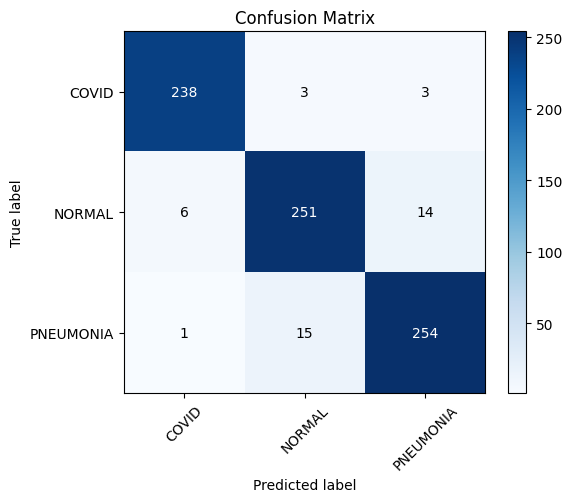

TEST acc         : 0.9464968152866242
TEST macro_f1    : 0.9473488703276001
TEST weighted_f1 : 0.9464629568649082
TEST per_class   : [{'precision': 0.9714285714285714, 'recall': 0.9754098360655737, 'f1': 0.9734151329243353, 'support': 244}, {'precision': 0.9330855018587361, 'recall': 0.9261992619926199, 'f1': 0.9296296296296296, 'support': 271}, {'precision': 0.9372693726937269, 'recall': 0.9407407407407408, 'f1': 0.9390018484288354, 'support': 270}]


{'acc': 0.9464968152866242,
 'micro_precision': 0.9464968152866242,
 'micro_recall': 0.9464968152866242,
 'micro_f1': 0.9464968152866242,
 'macro_precision': 0.9472611486603447,
 'macro_recall': 0.9474499462663114,
 'macro_f1': 0.9473488703276001,
 'weighted_precision': 0.9464426408402485,
 'weighted_recall': 0.9464968152866242,
 'weighted_f1': 0.9464629568649082,
 'per_class': [{'precision': 0.9714285714285714,
   'recall': 0.9754098360655737,
   'f1': 0.9734151329243353,
   'support': 244},
  {'precision': 0.9330855018587361,
   'recall': 0.9261992619926199,
   'f1': 0.9296296296296296,
   'support': 271},
  {'precision': 0.9372693726937269,
   'recall': 0.9407407407407408,
   'f1': 0.9390018484288354,
   'support': 270}],
 'confusion_matrix': tensor([[238,   3,   3],
         [  6, 251,  14],
         [  1,  15, 254]]),
 'logits': tensor([[-1.1352,  0.3988,  1.7744],
         [-0.7545,  1.8111, -1.1573],
         [-1.4140,  3.2906, -1.6799],
         ...,
         [ 3.2704, -1.5766,

In [ ]:
# load best model
ckpt = torch.load("/content/checkpoints/mobilenet_v3_small_skk.pt", map_location=device)

if isinstance(ckpt, dict) and "model_state" in ckpt:
    model_resnet_enc.load_state_dict(ckpt["model_state"])
else:
    model_resnet_enc.load_state_dict(ckpt)

model_resnet_enc.to(device)
model_resnet_enc.eval()

# evaluate on TEST
test_result = evaluate_full(
    model_resnet_enc,
    test_enc_loader,
    device=device,
    num_classes=3
)

plot_confusion_matrix(
    test_result["confusion_matrix"],
    class_names=train_enc_ds_full.classes,
    normalize=False
)

print("TEST acc         :", test_result["acc"])
print("TEST macro_f1    :", test_result["macro_f1"])
print("TEST weighted_f1 :", test_result["weighted_f1"])
print("TEST per_class   :", test_result["per_class"])

test_result

## Huang

In [ ]:
!cp -r '/content/drive/MyDrive/cv_22641171_NgoTruongDinh/lab_bo_sung_10 03 2026/imgs_huang2022' /content/data_huang2022

In [ ]:
import os

root = "/content/data_huang2022"
valid_exts = (".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp")

total = 0

for cls in os.listdir(root):
    cls_path = os.path.join(root, cls)
    if os.path.isdir(cls_path):
        n = sum(
            1 for f in os.listdir(cls_path)
            if f.lower().endswith(valid_exts)
        )
        print(f"{cls}: {n}")
        total += n

print("Tổng:", total)

NORMAL: 1802
PNEUMONIA: 1800
COVID: 1626
Tổng: 5228


In [ ]:
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import train_test_split
import numpy as np
import os

DATASET_ENCRYPTED_TRAIN = "/content/data_huang2022"
ENC_TRAIN = DATASET_ENCRYPTED_TRAIN

BATCH_SIZE = 64
NUM_WORKERS = 8
SEED = 42


full_ds = ImageFolder(ENC_TRAIN)
targets = np.array(full_ds.targets)
indices = np.arange(len(full_ds))

train_idx, temp_idx = train_test_split(
    indices,
    test_size=0.1,
    stratify=targets,
    random_state=SEED
)

temp_targets = targets[temp_idx]
val_idx, test_idx = train_test_split(
    temp_idx,
    test_size=0.5,
    stratify=temp_targets,
    random_state=SEED
)

tf_stats = transforms.Compose([
    transforms.ToTensor(),
])

stats_ds_full = ImageFolder(ENC_TRAIN, transform=tf_stats)
train_stats_ds = Subset(stats_ds_full, train_idx)

mean_enc, std_enc = compute_mean_std(
    train_stats_ds,
    batch_size=BATCH_SIZE,
    max_samples=None
)

print("mean_enc:", mean_enc)
print("std_enc :", std_enc)

Compute mean/std:   0%|          | 0/74 [00:00<?, ?it/s]

mean_enc: [0.4999599754810333, 0.49995559453964233, 0.49994978308677673]
std_enc : [0.21332694590091705, 0.21334251761436462, 0.21331395208835602]


In [ ]:
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import train_test_split
import numpy as np

# =========================
# 3) Transform
# =========================
train_tf = transforms.Compose([
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomRotation(3),
    transforms.ToTensor(),
    transforms.Normalize(mean_enc, std_enc),
])

eval_tf = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean_enc, std_enc),
])


train_enc_ds_full = ImageFolder(ENC_TRAIN, transform=train_tf)
eval_enc_ds_full  = ImageFolder(ENC_TRAIN, transform=eval_tf)

train_enc_ds = Subset(train_enc_ds_full, train_idx)
val_enc_ds   = Subset(eval_enc_ds_full, val_idx)
test_enc_ds  = Subset(eval_enc_ds_full, test_idx)


train_enc_loader = DataLoader(
    train_enc_ds,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    persistent_workers=(NUM_WORKERS > 0),
    drop_last=True
)

val_enc_loader = DataLoader(
    val_enc_ds,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    persistent_workers=(NUM_WORKERS > 0),
    drop_last=False
)

test_enc_loader = DataLoader(
    test_enc_ds,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    persistent_workers=(NUM_WORKERS > 0),
    drop_last=False
)

print("train:", len(train_enc_ds))
print("val  :", len(val_enc_ds))
print("test :", len(test_enc_ds))
print("classes:", train_enc_ds_full.classes)
print("class_to_idx:", train_enc_ds_full.class_to_idx)

# kiểm tra phân bố class từng split
train_targets = targets[train_idx]
val_targets   = targets[val_idx]
test_targets  = targets[test_idx]

print("train class counts:", np.bincount(train_targets))
print("val   class counts:", np.bincount(val_targets))
print("test  class counts:", np.bincount(test_targets))

train: 4705
val  : 261
test : 262
classes: ['COVID', 'NORMAL', 'PNEUMONIA']
class_to_idx: {'COVID': 0, 'NORMAL': 1, 'PNEUMONIA': 2}
train class counts: [1463 1622 1620]
val   class counts: [81 90 90]
test  class counts: [82 90 90]


In [ ]:
import math
device = "cuda" if torch.cuda.is_available() else "cpu"

EPOCHS = 50
LR = 1e-4

model_resnet_enc = mobilenet_v3_small(
    num_classes=3,
    pretrained=True,
    freeze_backbone=False
).to(device)

best_path, csv_path = fit(
    model_resnet_enc,
    train_loader=train_enc_loader,
    val_loader=val_enc_loader,
    mixup = False,
    device=device,
    epochs=EPOCHS,
    lr=LR,
    weight_decay=1e-4,
    patience=10,
    csv_path="logs/mobilenet_v3_small_log_huang.csv",
    best_path="checkpoints/mobilenet_v3_small_huang.pt",
    num_classes=3,
    use_amp=True,
)

Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 01/50 | train loss 0.8159 acc 0.6552 || val loss 0.9289 acc 0.5594 macroF1 0.4853 | lr 9.99e-05 save


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 02/50 | train loss 0.5149 acc 0.8412 || val loss 0.5670 acc 0.8084 macroF1 0.8103 | lr 9.96e-05 save


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 03/50 | train loss 0.4463 acc 0.8696 || val loss 0.3499 acc 0.9425 macroF1 0.9432 | lr 9.91e-05 save


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 04/50 | train loss 0.4122 acc 0.8857 || val loss 0.3398 acc 0.9310 macroF1 0.9314 | lr 9.84e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 05/50 | train loss 0.3811 acc 0.9077 || val loss 0.2973 acc 0.9425 macroF1 0.9430 | lr 9.76e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 06/50 | train loss 0.3597 acc 0.9170 || val loss 0.2958 acc 0.9425 macroF1 0.9432 | lr 9.65e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 07/50 | train loss 0.3431 acc 0.9240 || val loss 0.3125 acc 0.9157 macroF1 0.9163 | lr 9.52e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 08/50 | train loss 0.3280 acc 0.9270 || val loss 0.2846 acc 0.9425 macroF1 0.9429 | lr 9.38e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 09/50 | train loss 0.3214 acc 0.9356 || val loss 0.3030 acc 0.9425 macroF1 0.9430 | lr 9.22e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 10/50 | train loss 0.3019 acc 0.9454 || val loss 0.3040 acc 0.9349 macroF1 0.9357 | lr 9.05e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 11/50 | train loss 0.2949 acc 0.9471 || val loss 0.2705 acc 0.9502 macroF1 0.9508 | lr 8.85e-05 save


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 12/50 | train loss 0.2729 acc 0.9559 || val loss 0.2711 acc 0.9502 macroF1 0.9508 | lr 8.64e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 13/50 | train loss 0.2730 acc 0.9553 || val loss 0.2911 acc 0.9425 macroF1 0.9431 | lr 8.42e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 14/50 | train loss 0.2649 acc 0.9606 || val loss 0.2963 acc 0.9425 macroF1 0.9439 | lr 8.19e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 15/50 | train loss 0.2656 acc 0.9578 || val loss 0.2679 acc 0.9502 macroF1 0.9513 | lr 7.94e-05 save


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 16/50 | train loss 0.2510 acc 0.9673 || val loss 0.2892 acc 0.9425 macroF1 0.9439 | lr 7.68e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 17/50 | train loss 0.2508 acc 0.9677 || val loss 0.2849 acc 0.9464 macroF1 0.9472 | lr 7.41e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 18/50 | train loss 0.2381 acc 0.9730 || val loss 0.2520 acc 0.9579 macroF1 0.9588 | lr 7.13e-05 save


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 19/50 | train loss 0.2390 acc 0.9722 || val loss 0.2499 acc 0.9693 macroF1 0.9704 | lr 6.84e-05 save


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 20/50 | train loss 0.2308 acc 0.9771 || val loss 0.2617 acc 0.9579 macroF1 0.9590 | lr 6.55e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 21/50 | train loss 0.2283 acc 0.9788 || val loss 0.3020 acc 0.9310 macroF1 0.9320 | lr 6.24e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 22/50 | train loss 0.2251 acc 0.9782 || val loss 0.2426 acc 0.9693 macroF1 0.9703 | lr 5.94e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 23/50 | train loss 0.2211 acc 0.9820 || val loss 0.2576 acc 0.9579 macroF1 0.9591 | lr 5.63e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 24/50 | train loss 0.2121 acc 0.9878 || val loss 0.2466 acc 0.9579 macroF1 0.9589 | lr 5.31e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 25/50 | train loss 0.2153 acc 0.9842 || val loss 0.2530 acc 0.9579 macroF1 0.9590 | lr 5.00e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 26/50 | train loss 0.2132 acc 0.9863 || val loss 0.2532 acc 0.9617 macroF1 0.9629 | lr 4.69e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 27/50 | train loss 0.2107 acc 0.9884 || val loss 0.2746 acc 0.9425 macroF1 0.9430 | lr 4.37e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 28/50 | train loss 0.2080 acc 0.9895 || val loss 0.2542 acc 0.9579 macroF1 0.9584 | lr 4.06e-05


Train:   0%|          | 0/73 [00:00<?, ?it/s]

Epoch 29/50 | train loss 0.2072 acc 0.9872 || val loss 0.2481 acc 0.9655 macroF1 0.9658 | lr 3.76e-05
Early stopping at epoch 29 (best macroF1=0.9704)


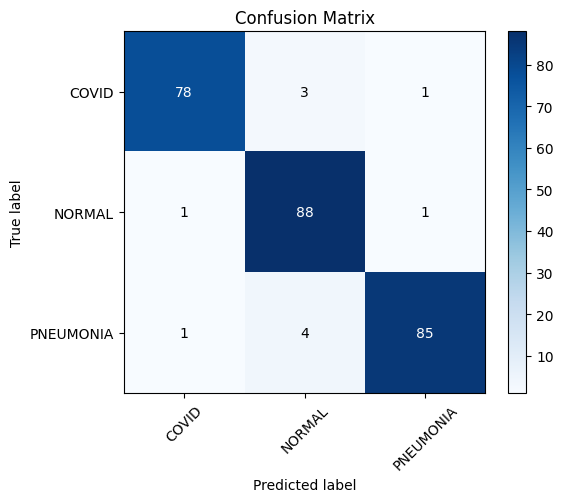

TEST acc         : 0.9580152671755725
TEST macro_f1    : 0.9582554305718148
TEST weighted_f1 : 0.9581116891247569
TEST per_class   : [{'precision': 0.975, 'recall': 0.9512195121951219, 'f1': 0.9629629629629629, 'support': 82}, {'precision': 0.9263157894736842, 'recall': 0.9777777777777777, 'f1': 0.9513513513513514, 'support': 90}, {'precision': 0.9770114942528736, 'recall': 0.9444444444444444, 'f1': 0.96045197740113, 'support': 90}]


{'acc': 0.9580152671755725,
 'micro_precision': 0.9580152671755725,
 'micro_recall': 0.9580152671755725,
 'micro_f1': 0.9580152671755725,
 'macro_precision': 0.9594424279088526,
 'macro_recall': 0.957813911472448,
 'macro_f1': 0.9582554305718148,
 'weighted_precision': 0.9589673875396573,
 'weighted_recall': 0.9580152671755725,
 'weighted_f1': 0.9581116891247569,
 'per_class': [{'precision': 0.975,
   'recall': 0.9512195121951219,
   'f1': 0.9629629629629629,
   'support': 82},
  {'precision': 0.9263157894736842,
   'recall': 0.9777777777777777,
   'f1': 0.9513513513513514,
   'support': 90},
  {'precision': 0.9770114942528736,
   'recall': 0.9444444444444444,
   'f1': 0.96045197740113,
   'support': 90}],
 'confusion_matrix': tensor([[78,  3,  1],
         [ 1, 88,  1],
         [ 1,  4, 85]]),
 'logits': tensor([[-1.3172e+00, -1.1147e-01,  1.9440e+00],
         [-1.3359e+00,  2.4007e+00, -1.0981e+00],
         [ 2.8621e+00, -1.6029e+00, -1.1686e+00],
         [ 3.0149e+00, -1.2784e+0

In [ ]:
# load best model
ckpt = torch.load("/content/checkpoints/mobilenet_v3_small_huang.pt", map_location=device)

if isinstance(ckpt, dict) and "model_state" in ckpt:
    model_resnet_enc.load_state_dict(ckpt["model_state"])
else:
    model_resnet_enc.load_state_dict(ckpt)

model_resnet_enc.to(device)
model_resnet_enc.eval()

# evaluate on TEST
test_result = evaluate_full(
    model_resnet_enc,
    test_enc_loader,
    device=device,
    num_classes=3
)

plot_confusion_matrix(
    test_result["confusion_matrix"],
    class_names=train_enc_ds_full.classes,
    normalize=False
)

print("TEST acc         :", test_result["acc"])
print("TEST macro_f1    :", test_result["macro_f1"])
print("TEST weighted_f1 :", test_result["weighted_f1"])
print("TEST per_class   :", test_result["per_class"])

test_result